1. Pré-requisitos

In [1]:
!pip install pdfminer.six
!python -m spacy download pt_core_news_sm
import nltk

nltk.download('stopwords')


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 24.7 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('pt_core_news_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
from google.colab import drive

drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


2. Guarde os conteúdos num ficheiro JSON adotando uma estrutura de dados apropriada com vista a guardar todos os dados relevantes obtidos. Por exemplo, no caso de um programa eleitoral, seria adequado guardar o nome do partido político, o líder do partido à data da eleição, a designação da eleição, a data da eleição, o texto, assim como outros elementos relevantes extraídos a partir da aplicação de ferramentas de NLP ao texto, nomeadamente, palavras-relevantes, entidades (NER – named entity recognition), datas e outras que achar adequadas. Seja criativo.

In [ ]:
import os
import json
import spacy
import concurrent.futures
from pdfminer.high_level import extract_text

max_workers = 5
save_memory = False
root_path = "/content/drive/My Drive/Colab Notebooks/esoterismo"
pdf_path = os.path.join(root_path, "pdf")
books = []
id = 0

def extract_book_from_pdf(filename):
  def extract_book_title_and_author(category, filename):
    raw_name = filename[:-4]
    if raw_name[:2].isdigit():
      raw_name = raw_name[3:]
    splitters = ["autor", "Autor", "-"]
    for splitter in splitters:
      if splitter in raw_name:
        splitted_name = raw_name.split(splitter)
        return splitted_name[0].strip(), splitted_name[1].strip()
    return raw_name, ""

  print(f"    Extracting content of: {filename}")
  title, author = extract_book_title_and_author(filename)
  content = extract_text(os.path.join(pdf_path, category, filename)).replace(".....", "").strip()
  doc = nlp(content)
  id += 1
  return {
    "id": id,
    "title": title,
    "author": author,
    "category": category,
    "filename": filename,
    "entities": [{"text": ent.text, "label": ent.label_ } for ent in doc.ents if ent.label_ != 'DATE'],
    "keywords": [token.text for token in doc if not token.is_stop and not token.is_punct],
    "dates": [ent.text for ent in doc.ents if ent.label_ == 'DATE'],
    "content": content
  }

def save_book_in_disk(book):
  with open(os.path.join(root_path, "books.json"), "a") as books_file:
    if (id > 1):
      books_file.write(",")
    books_file.write(json.dumps(book))

def save_book_in_memory(book):
  books.append(book)

nlp = spacy.load("pt_core_news_sm")
nlp.max_length = 3000000
save_book = save_book_in_memory
if save_memory:
  save_book = save_book_in_disk
  with open(os.path.join(root_path, "books.json"), "w") as books_file:
    books_file.write("[")

for category in os.listdir(pdf_path):
  print(f"Reading folder: {category}")
  with concurrent.futures.ThreadPoolExecutor(max_workers=max_workers) as executor:
    future_book = {executor.submit(extract_book_from_pdf, category, filename): filename for filename in os.listdir(os.path.join(pdf_path, category))}
    for future in concurrent.futures.as_completed(future_book):
      book  = future.result()
      if book:
        save_book(book)

if save_memory:
  with open(os.path.join(root_path, "books.json"), "a") as books_file:
    books_file.write("]")
else:
  with open(os.path.join(root_path, "books.json"), "w") as books_file:
    json.dump(books, books_file)

Reading folder: angeologia
    Extracting content of: 01. Angeologia Autor Igreja de Nosso Senhor Jesus Cristo.pdf
    Extracting content of: 02. O Livro dos Anjos Autor Ramon Llull.pdf
    Extracting content of: 03. I enoque. Nos Bastidores de Crenças angeolológicas jadico-crisãs Autor Filipe Guimarães.pdf
    Extracting content of: 04. Angeologia Autor Jorge Luiz Silva Vieira.pdf
    Extracting content of: 05. Anjos Cabalísticos Autor Mônica Buonfiglio.pdf
    Extracting content of: 06. Teologia Sistemática. A Doutrina dos anjos - Angelologia Autor Edison Miranda da Silva e ROgério de Andrade Chagas.pdf
    Extracting content of: 07. Anjologia (Artigo) Autor João Domingos Soares de Oliveira.pdf
    Extracting content of: 08. Os Anjos Autor Alcance Curitiba.pdf
    Extracting content of: 09. Anjos & Demônios Autor Roberto Aguilar Machado Santos Silva.pdf
    Extracting content of: 10. O livro secreto dos Anjos Autor O Nome do seu Anjo da Guarda.pdf
    Extracting content of:

    Extracting content of: 07. Transmutação Alquímica na Obra de Roger Bacon autor Otavio Tavares de Lemos Santos.pdf


    Extracting content of: 08. O conflito dos discursos sobre a Alquimia no fim da Idade Média autor Bruno Sousa Silva Godinho.pdf
Reading folder: astrologia
    Extracting content of: 01. Curso Básico de Astrologia autor Ciça Bueno e Márcia Mattos.pdf
    Extracting content of: 02. Astrologia Para Totós (apresentação) autor Catarina Dias & Francesca Cruz.pdf
    Extracting content of: 03. Astrologia Clássica e Esotérica autor Viviane M. E. Oliveira.pdf
    Extracting content of: 04. Manual de Astrologia autor Vera Luz.pdf
    Extracting content of: 05. A Lua Negra na Astrologia (apresentação) autor Sofia Alves.pdf
    Extracting content of: 06. O EU em processo evolutivo! Progressões secundárias (apresentação) autor Liliane Nunes.pdf
    Extracting content of: 07. A Noção De Destino Na Astrologia E Sua Influência No Pensamento Ocidental (Artigo) autor Vani Terezinha De Rezende.pdf
    Extracting content of: 08. Analisando os símbolos astrológicos autor Pelo Amor da

    Extracting content of: 06. Reinventando tradições. Representações e identidades da bruxaria neopagã no Brasil Autor Janluis Duarte.pdf
    Extracting content of: 07. O universo da feitiçaria, magia e variantes Autor Nubia Hanciau.pdf
    Extracting content of: 08. Uma feiticeira no século XX Autor Nilza Menezes.pdf
    Extracting content of: 09. A Bruxaira nos tempos modernos - sintoma de crise na transição para a modernidade Autor Peter Johann Mainka.pdf
    Extracting content of: 10. Feitiçaria, Terminologia e Apropriações Autor Suzane Pinho Pêpe.pdf
    Extracting content of: 11. A migração do Sabbat. A presença ,estrangeira, das bruxas europeias no innaginário ibérico Autor Carlos Roberto F. Nogueira.pdf
    Extracting content of: 12. Inquisição, pacto com o demônio e magia africana em Lisboa no século XVIII Autor Didier Lahon.pdf
    Extracting content of: 13. Bruxaria e religiosidae popular. Crenças e Práticas ocultas num quotidiano católico Autor Pau

3. Carregue o ficheiro JSON (anteriormente criado) para o seu ambiente de programação.

In [ ]:
def load_books():
  with open(os.path.join(root_path, "books.json"), "r") as readfile:
    return json.load(readfile)

books = load_books()
len(books)

135

4. Imprima o conteúdo do ficheiro JSON, restrito aos 5 primeiros registos.

In [ ]:
summaries = [{
    **book,
    "entities": len(book["entities"]),
    "keywords": len(book["keywords"]),
    "content": len(book["content"]) } for book in books[:5]]
for summary in summaries:
  print(summary)

{'id': 1, 'title': 'Angeologia', 'author': 'Igreja de Nosso Senhor Jesus Cristo', 'category': 'angeologia', 'filename': '01. Angeologia Autor Igreja de Nosso Senhor Jesus Cristo.pdf', 'entities': 2487, 'keywords': 22047, 'dates': [], 'content': 176351}
{'id': 2, 'title': 'O Livro dos Anjos', 'author': 'Ramon Llull', 'category': 'angeologia', 'filename': '02. O Livro dos Anjos Autor Ramon Llull.pdf', 'entities': 2764, 'keywords': 29413, 'dates': [], 'content': 207208}
{'id': 3, 'title': 'I enoque. Nos Bastidores de Crenças angeolológicas jadico-crisãs', 'author': 'Filipe Guimarães', 'category': 'angeologia', 'filename': '03. I enoque. Nos Bastidores de Crenças angeolológicas jadico-crisãs Autor Filipe Guimarães.pdf', 'entities': 2764, 'keywords': 29413, 'dates': [], 'content': 207208}
{'id': 4, 'title': 'Angeologia', 'author': 'Jorge Luiz Silva Vieira', 'category': 'angeologia', 'filename': '04. Angeologia Autor Jorge Luiz Silva Vieira.pdf', 'entities': 488, 'keywords': 5021, 'd

5. Crie uma nuvem de palavras a partir dos textos coletados. Seja criativo. Por exemplo, crie diferentes word clouds se tiver mais do que um período de tempo.

135 livros no total (content):


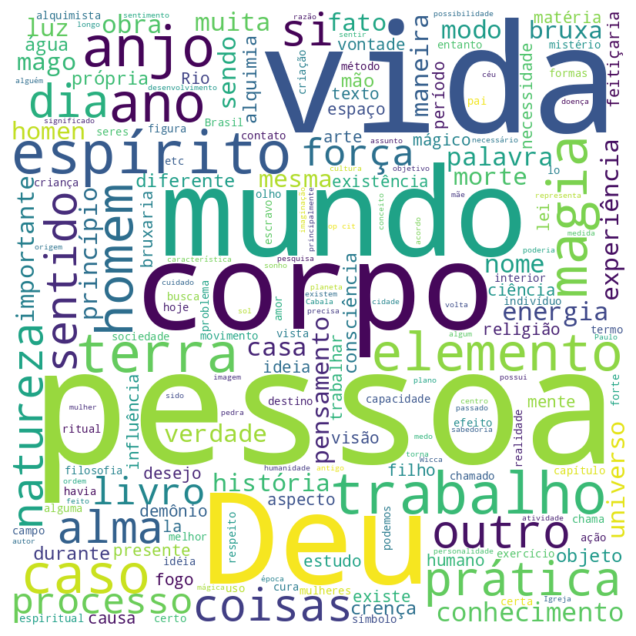


135 livros no total (entities):


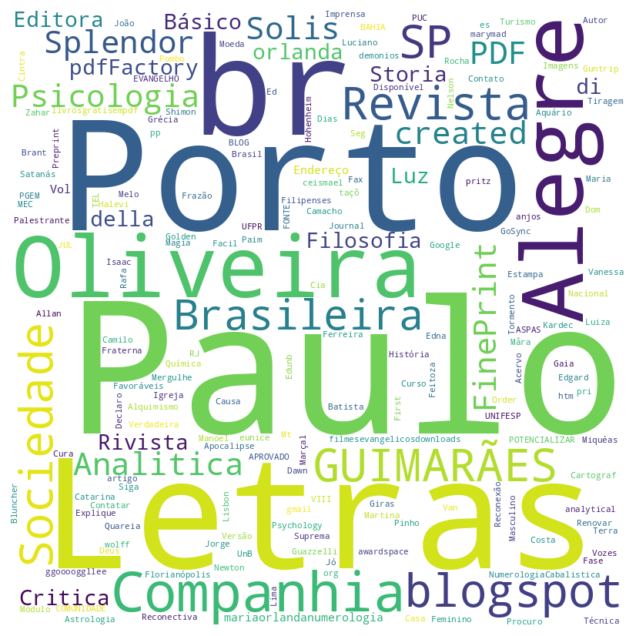


135 livros no total (keywords):


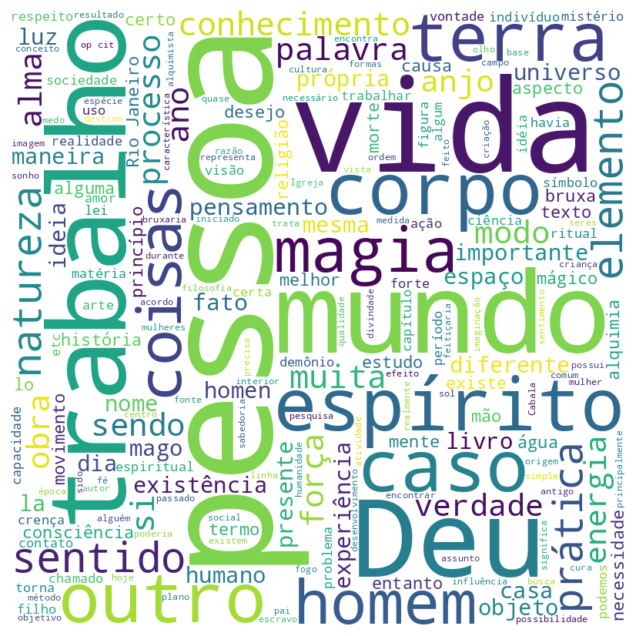


Não foram detetados(as) dates nos 135 livros no total!


16 livros sobre numerologia (content):


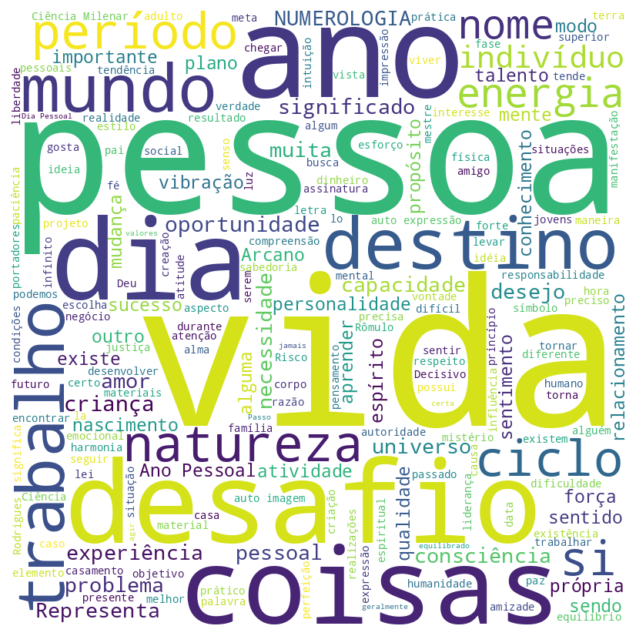


16 livros sobre numerologia (entities):


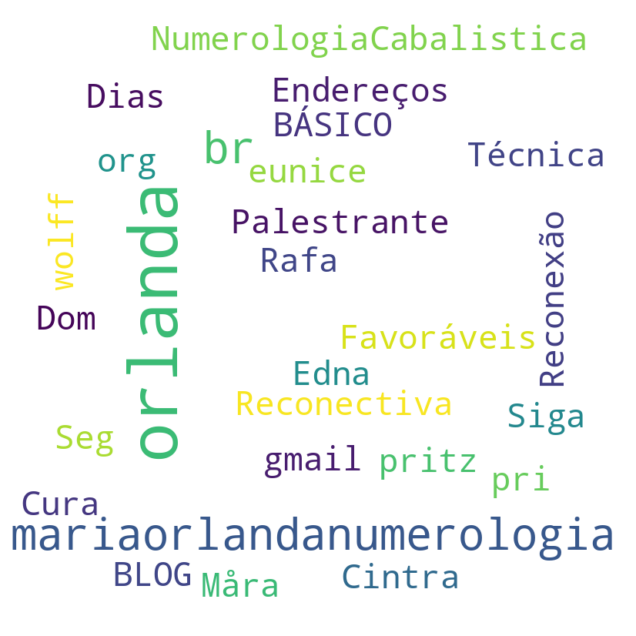


16 livros sobre numerologia (keywords):


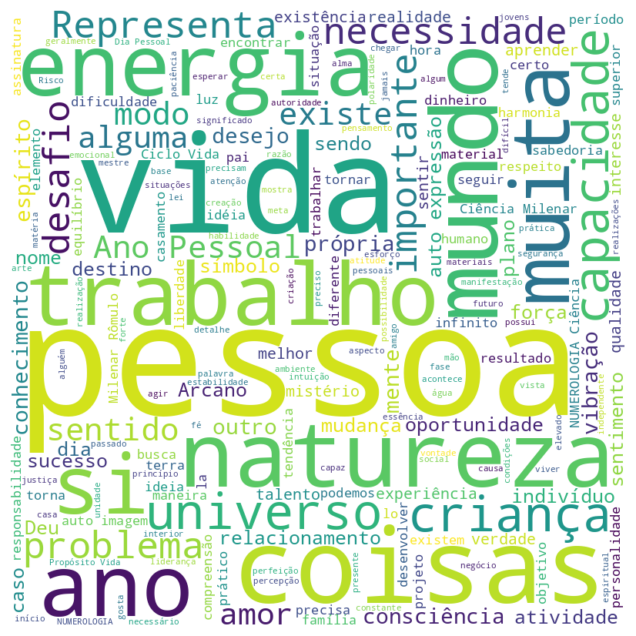


Não foram detetados(as) dates nos 16 livros sobre numerologia!


8 livros sobre feitiçaria (content):


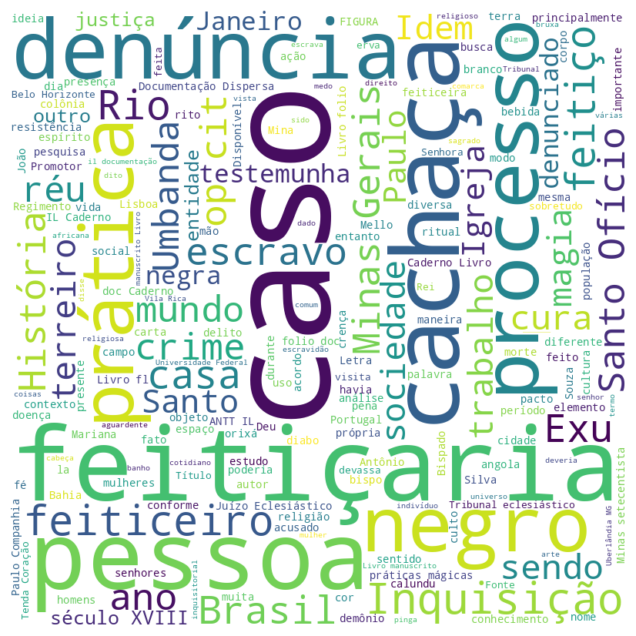


8 livros sobre feitiçaria (entities):


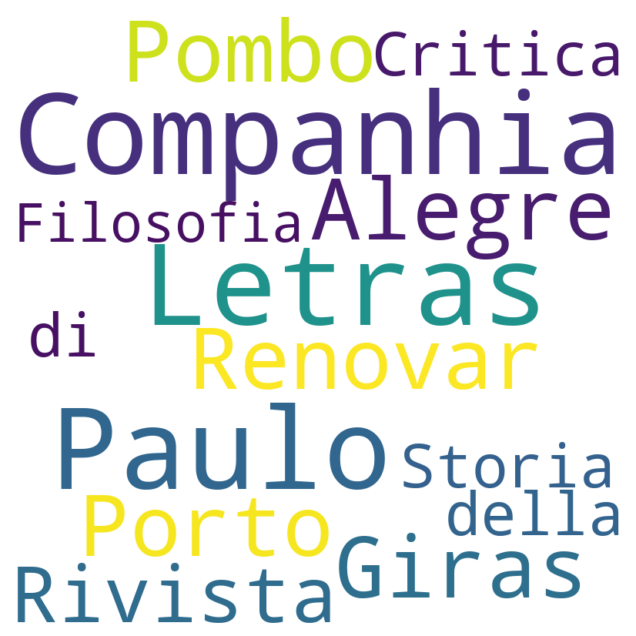


8 livros sobre feitiçaria (keywords):


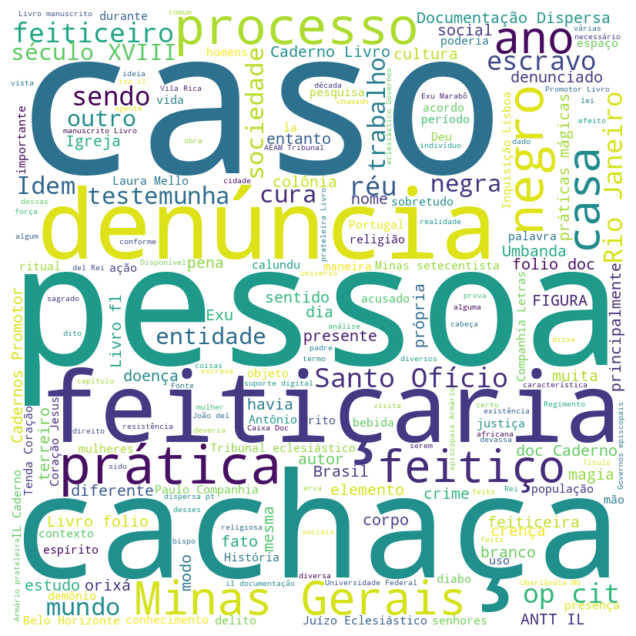


Não foram detetados(as) dates nos 8 livros sobre feitiçaria!


15 livros sobre ocultismo (content):


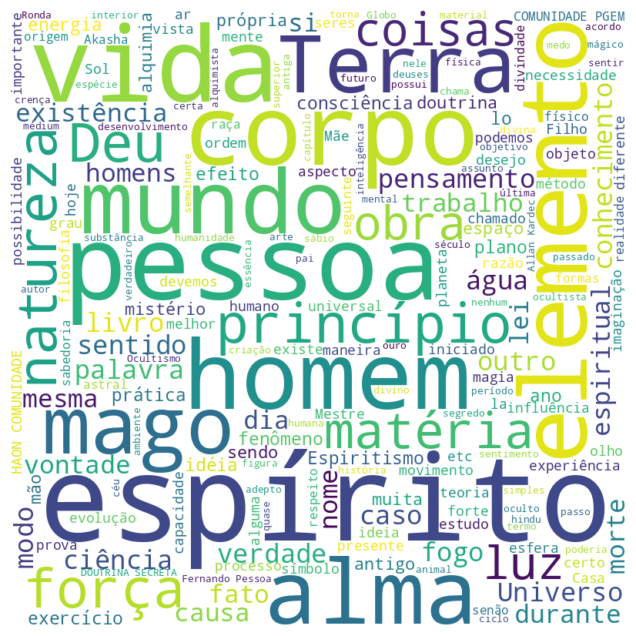


15 livros sobre ocultismo (entities):


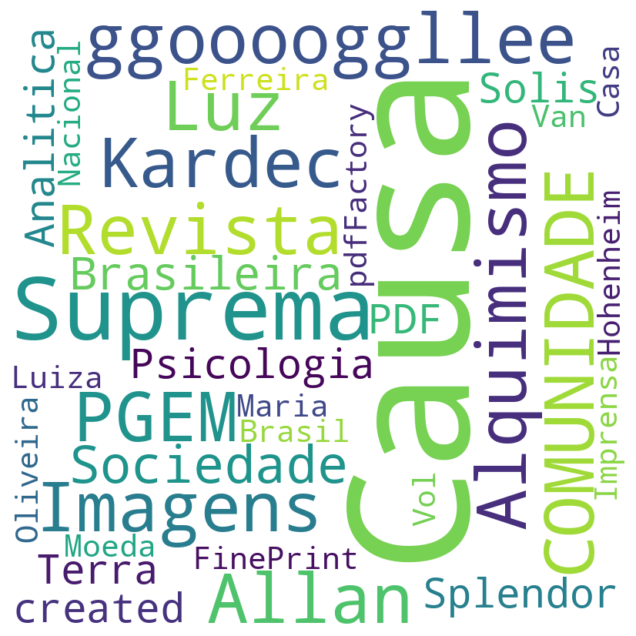


15 livros sobre ocultismo (keywords):


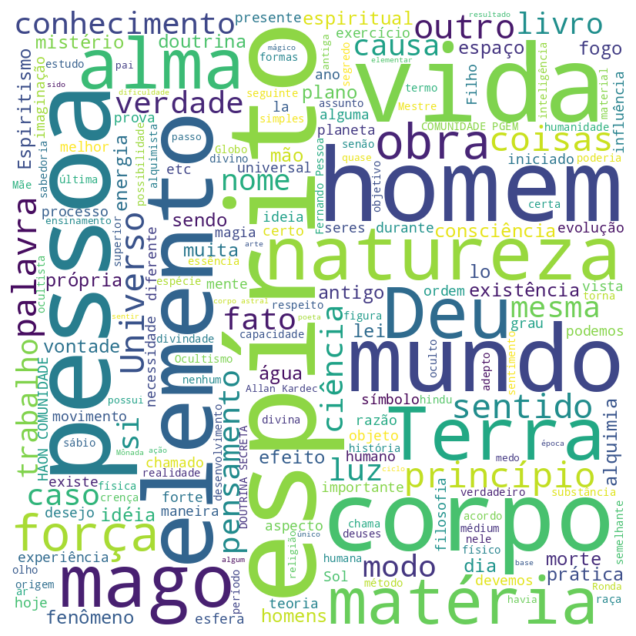


Não foram detetados(as) dates nos 15 livros sobre ocultismo!


17 livros sobre bruxaria (content):


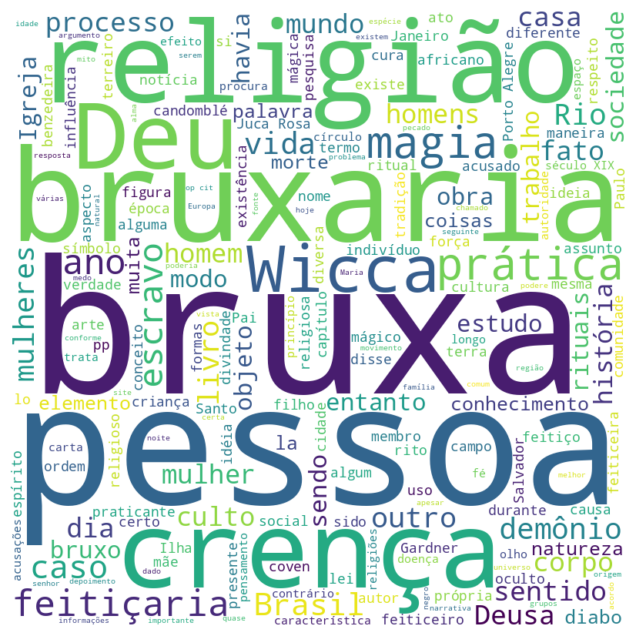


17 livros sobre bruxaria (entities):


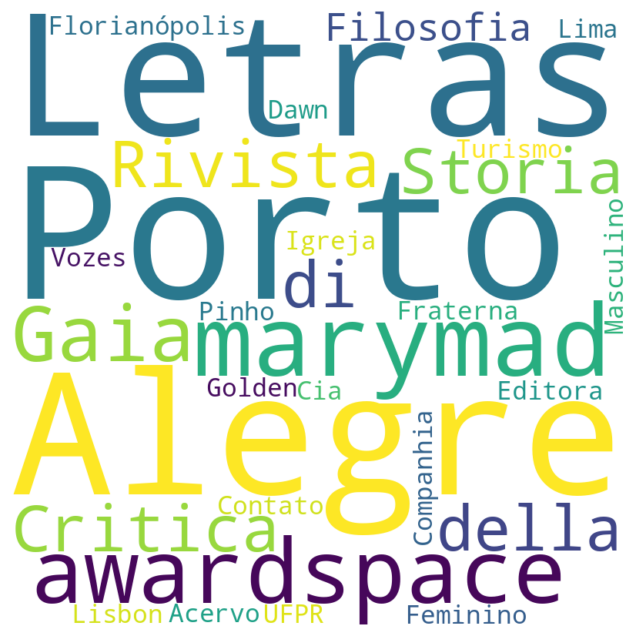


17 livros sobre bruxaria (keywords):


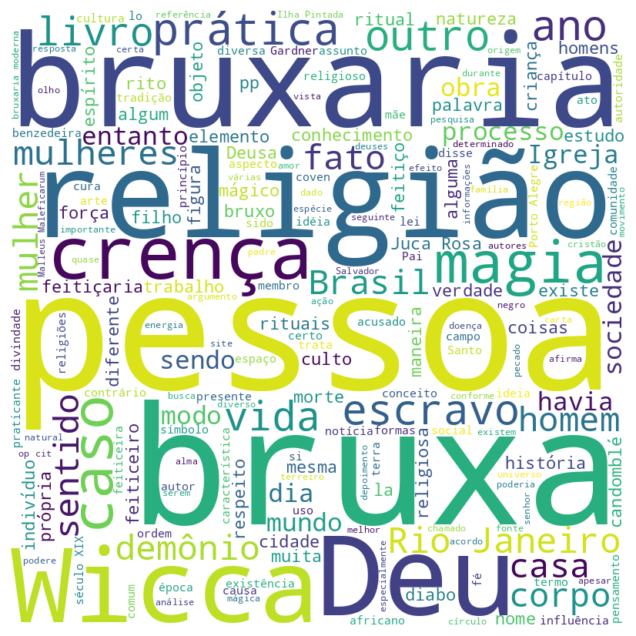


Não foram detetados(as) dates nos 17 livros sobre bruxaria!


17 livros sobre angeologia (content):


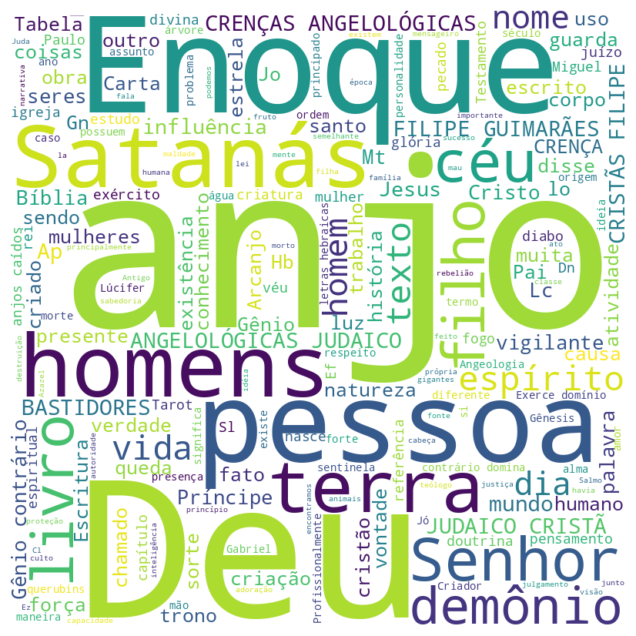


17 livros sobre angeologia (entities):


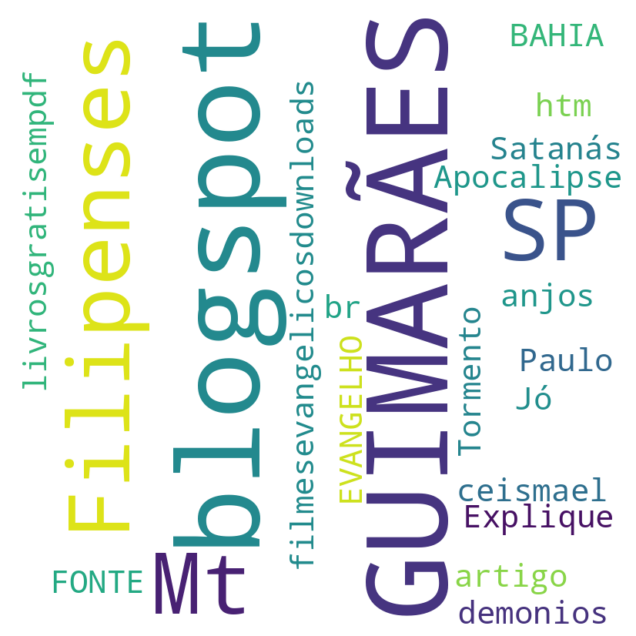


17 livros sobre angeologia (keywords):


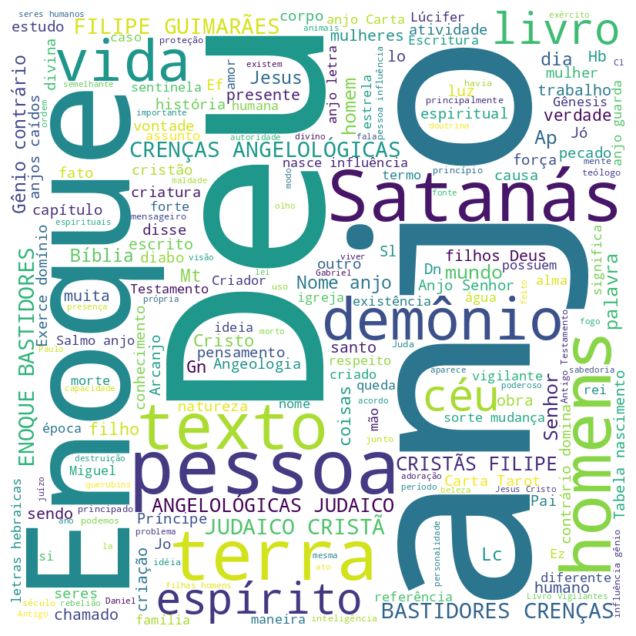


Não foram detetados(as) dates nos 17 livros sobre angeologia!


21 livros sobre alquimia (content):


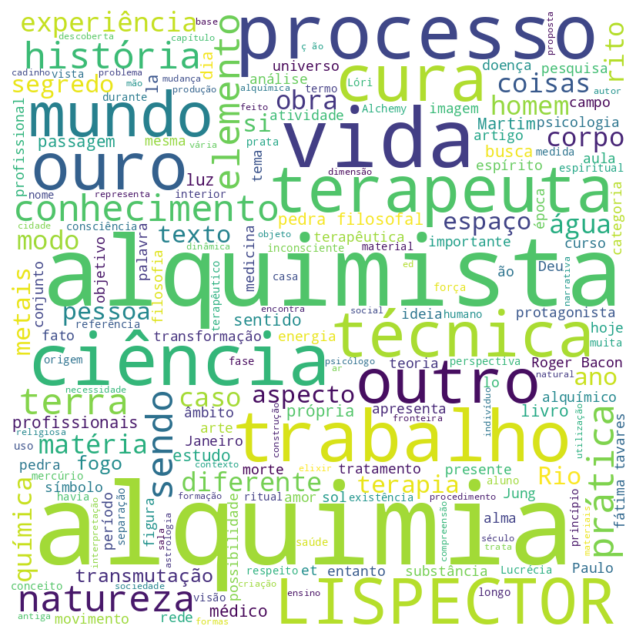


21 livros sobre alquimia (entities):


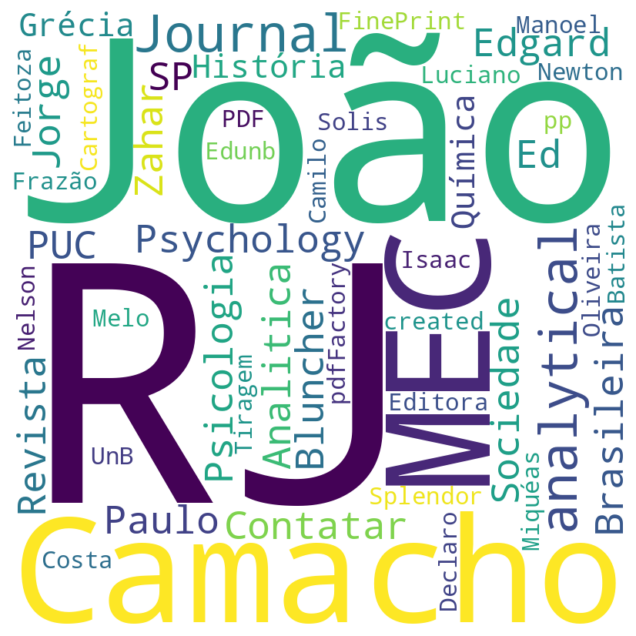


21 livros sobre alquimia (keywords):


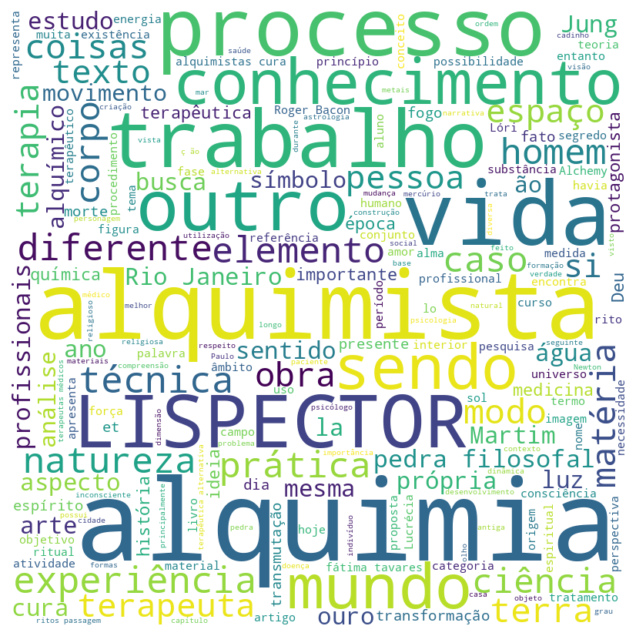


Não foram detetados(as) dates nos 21 livros sobre alquimia!


15 livros sobre astrologia (content):


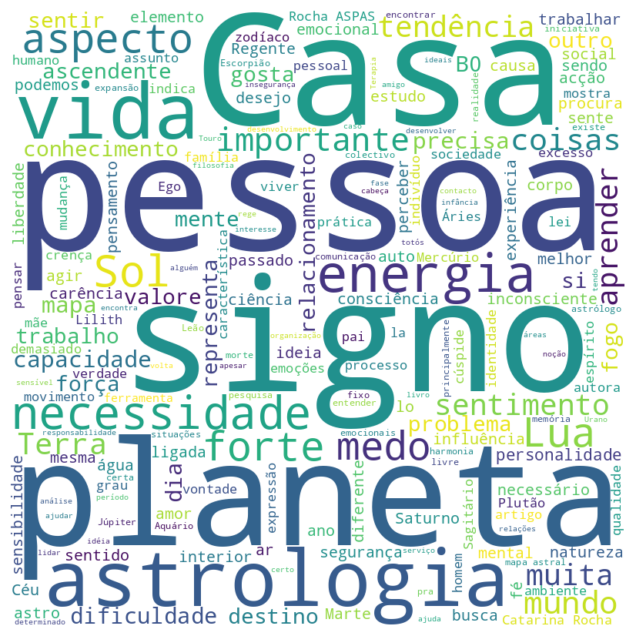


15 livros sobre astrologia (entities):


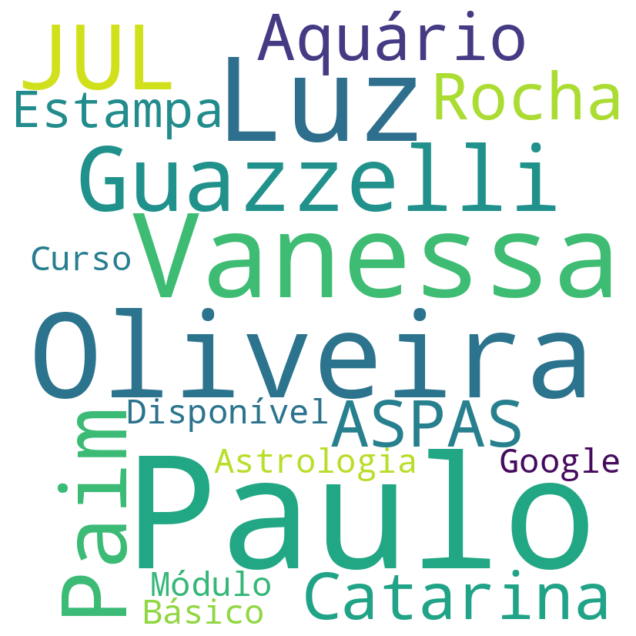


15 livros sobre astrologia (keywords):


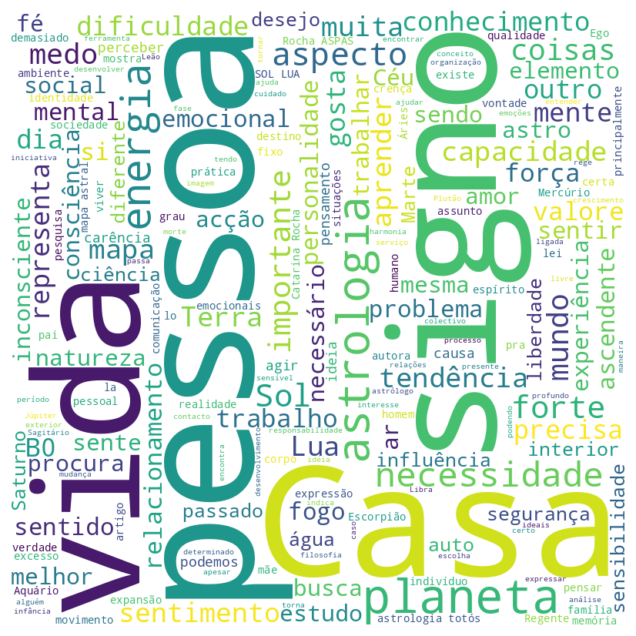


Não foram detetados(as) dates nos 15 livros sobre astrologia!


11 livros sobre kabbalah (content):


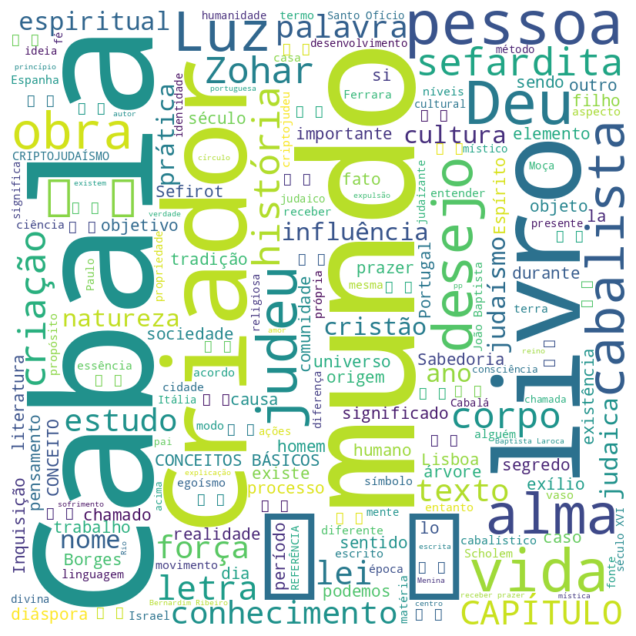


11 livros sobre kabbalah (entities):


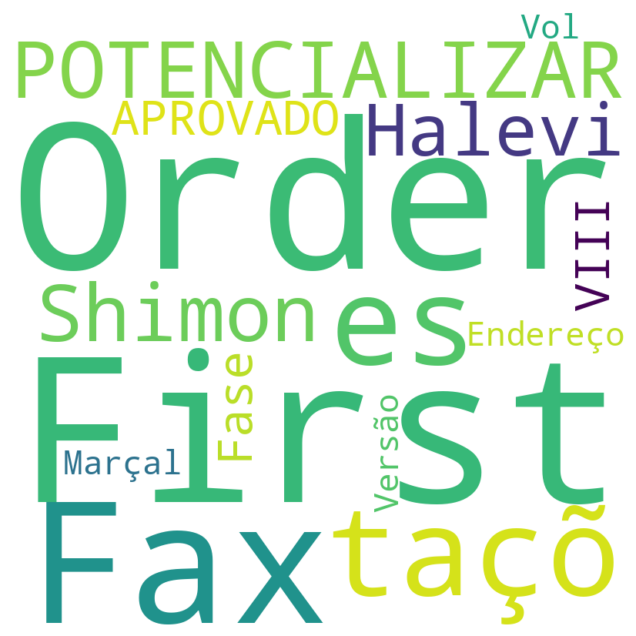


11 livros sobre kabbalah (keywords):


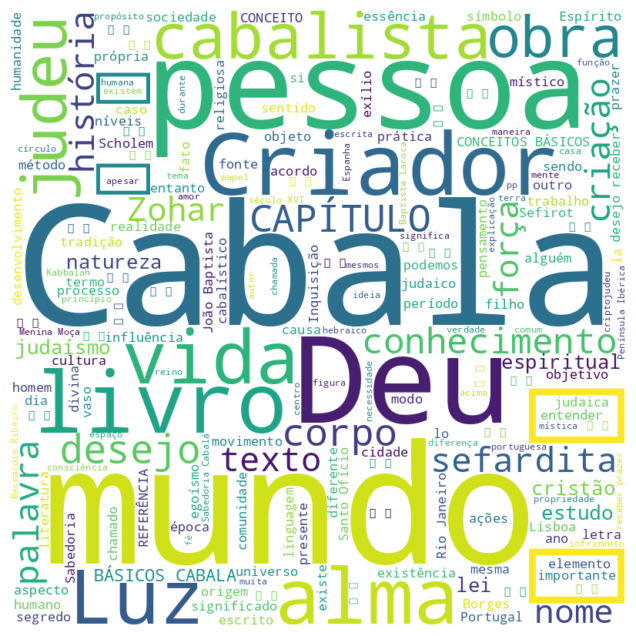


Não foram detetados(as) dates nos 11 livros sobre kabbalah!


7 livros sobre eneagrama (content):


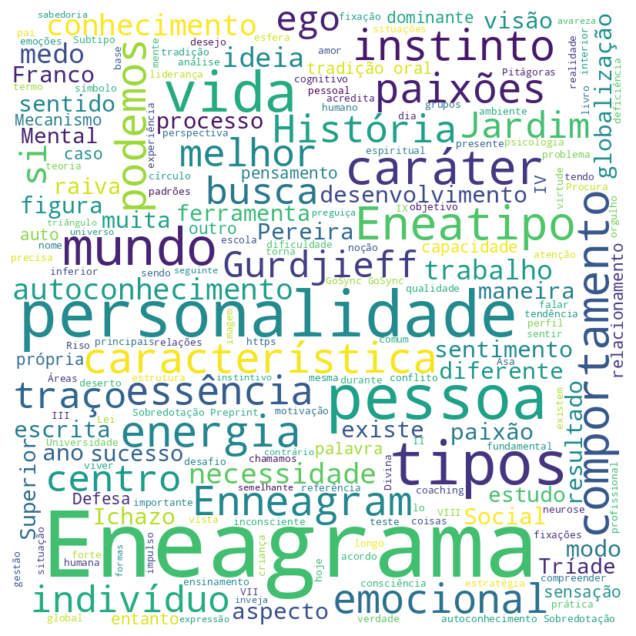


7 livros sobre eneagrama (entities):


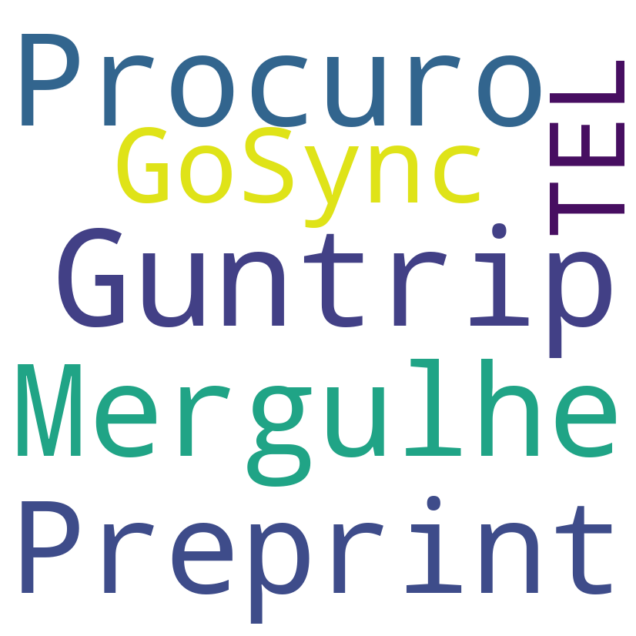


7 livros sobre eneagrama (keywords):


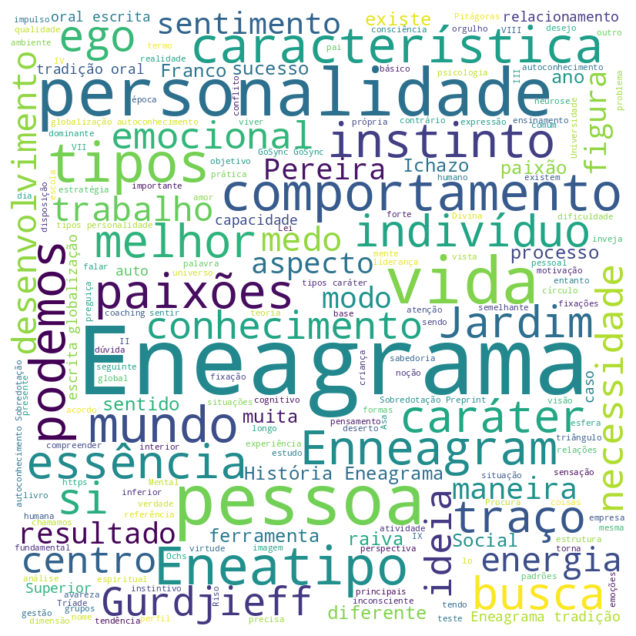


Não foram detetados(as) dates nos 7 livros sobre eneagrama!


8 livros sobre magia (content):


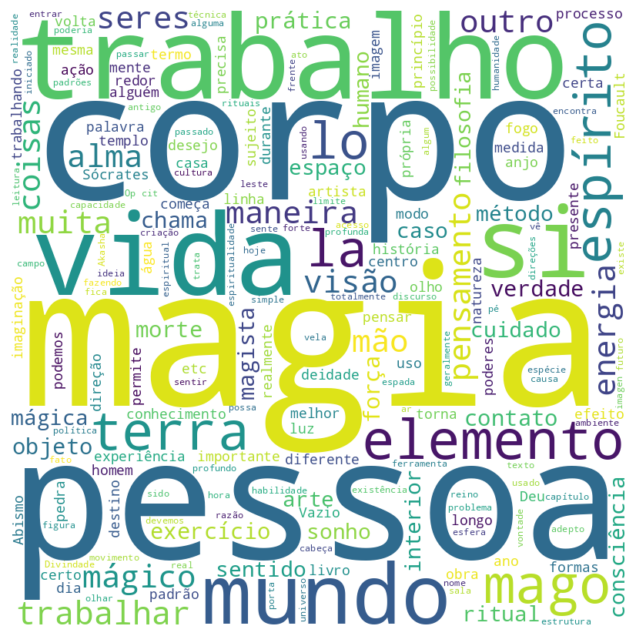


8 livros sobre magia (entities):


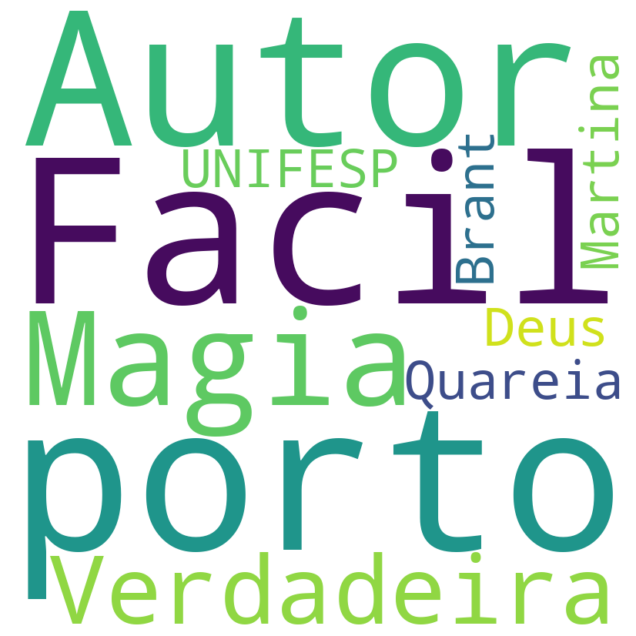


8 livros sobre magia (keywords):


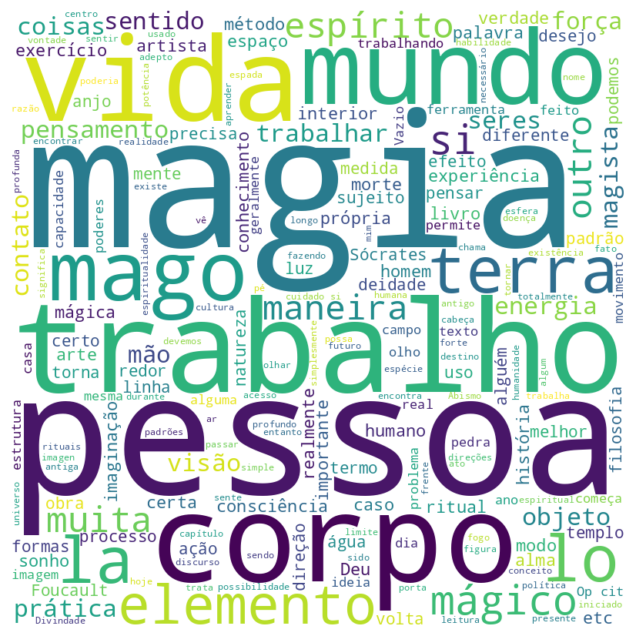


Não foram detetados(as) dates nos 8 livros sobre magia!



In [ ]:
from string import ascii_lowercase
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import itertools

def plot_wordcloud(text, figsize=8):
  nlp_stopwords = nlp.Defaults.stop_words
  nltk_stopwords = nltk.corpus.stopwords.words('portuguese')
  custom_stopwords = set(ascii_lowercase).union(["cid"])
  stopwords = STOPWORDS.union(nlp_stopwords).union(nltk_stopwords).union(custom_stopwords)
  WC = WordCloud(width=figsize*100, height=figsize*100, background_color="white", stopwords=stopwords)
  wordcloud = WC.generate(text)
  plt.figure(figsize=(figsize, figsize), facecolor=None)
  plt.imshow(wordcloud, interpolation="bilinear")
  plt.axis("off")
  plt.show()

def print_category_wordclouds(books, label, field, words, show_fields):
  if field not in show_fields:
    return
  if [word for word in words if word != ""]:
    content = " ".join(words)
    print(f"{len(books)} livros {label} ({field}):")
    plot_wordcloud(content)
  else:
    print(f"Não foram detetados(as) {field} nos {len(books)} livros {label}!")
  print()

def print_books_wordclouds(books, label, show_fields=["content", "entities", "keywords", "dates"]):
  field = "content"
  words = [book[field] for book in books]
  print_category_wordclouds(books, label, field, words, show_fields)
  field = "entities"
  entities_list = [book[field] for book in books]
  words = []
  for entities in entities_list:
    text_list = [entity["text"] for entity in entities]
    if text_list:
      words.append([entity["text"] for entity in entities].pop())
  print_category_wordclouds(books, label, field, words, show_fields)
  for field in ["keywords", "dates"]:
    words = [" ".join(book[field]) for book in books]
    print_category_wordclouds(books, label, field, words, show_fields)

print_books_wordclouds(books, "no total")
for category in set([book['category'] for book in books]):
  print()
  category_books = [book for book in books if book["category"] == category]
  print_books_wordclouds(category_books, f"sobre {category}")